In [1]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('City Power Consumption.csv')
df.head()

,S no,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
0,1,6.559,73.8,0.083,0.051,0.119,158.0,1,34055.69620
1,2,6.414,74.5,0.083,0.070,0.085,159.0,1,29814.68354
2,3,6.313,74.5,0.08,0.062,0.100,151.0,1,29128.10127
3,4,6.121,75,0.083,0.091,0.096,151.0,1,28228.86076
4,5,5.921,75.7,0.081,0.048,0.085,154.0,1,27335.69620


In [3]:
# dropping serial number column -
df = df.iloc[:,1:]
df.head()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
0,6.559,73.8,0.083,0.051,0.119,158.0,1,34055.69620
1,6.414,74.5,0.083,0.070,0.085,159.0,1,29814.68354
2,6.313,74.5,0.08,0.062,0.100,151.0,1,29128.10127
3,6.121,75,0.083,0.091,0.096,151.0,1,28228.86076
4,5.921,75.7,0.081,0.048,0.085,154.0,1,27335.69620


### EDA & data cleaning

In [4]:
# shape of dataframe -
df.shape

(52583, 8)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Temperature                   52263 non-null  object 
 1   Humidity                      52558 non-null  object 
 2   Wind Speed                    52512 non-null  object 
 3   general diffuse flows         52275 non-null  float64
 4   diffuse flows                 52568 non-null  float64
 5   Air Quality Index (PM)        52565 non-null  float64
 6   Cloudiness                    52583 non-null  int64  
 7    Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(4), int64(1), object(3)
memory usage: 3.2+ MB


In [6]:
df.describe()

,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52275.000000,52568.000000,52565.000000,52583.000000,52583.000000
mean,182.964247,74.872330,154.499191,0.009338,31061.821779
std,264.571351,124.084858,2.871553,0.096180,8021.057455
min,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,320.100000,100.500000,157.000000,0.000000,36721.582445
max,1163.000000,936.000000,159.000000,1.000000,52204.395120


In [46]:
# data distribution -
for i in (df.columns[:]):
    print(df[i].value_counts())
    print('****'*10)
    print("\n")

20.76    56
19.79    55
15.18    55
20.74    52
15.85    51
         ..
35.14     1
34.31     1
33.49     1
33.35     1
6.58      1
Name: Temperature, Length: 3438, dtype: int64
****************************************


85.9     200
85       190
84.6     189
86.3     188
86.6     187
        ... 
31.41      1
16.95      1
17.92      1
18.42      1
45.89      1
Name: Humidity, Length: 4444, dtype: int64
****************************************


0.082    2296
0.083    1984
0.084    1839
0.081    1803
0.085    1519
         ... 
0.366       1
0.624       1
0.81        1
0.43        1
3.006       1
Name: Wind Speed, Length: 549, dtype: int64
****************************************


0.055     1569
0.062     1544
0.051     1497
0.059     1466
0.066     1455
          ... 
51.320       1
46.680       1
46.080       1
42.690       1
5.819        1
Name: general diffuse flows, Length: 10497, dtype: int64
****************************************


0.115    1265
0.122    1223
0.119    1205
0.

In [47]:
for col in df.columns:
    print(col)
    print(df[col].unique())
    print('*'*15)

Temperature
['6.559' '6.414' '6.313' ... '6.947' '6.758' '6.58']
***************
Humidity
['73.8' '74.5' '75' ... '41.96' '41.22' '45.89']
***************
Wind Speed
['0.083' '0.08' '0.081' '0.085' '0.082' '0.084' '0.079' '8.50%' '0.076'
 '2.66' '4.93' '4.924' '4.923' '4.918' '4.916' '2.451' '0.077' '0.074'
 '0.075' '0.073' '0.086' '0.078' '0.072' nan '0.071' '0.091' '0.087'
 '0.09' '0.088' '0.089' '0.094' '0.069' '0.092' '2.287' '4.708' '1.97'
 '0.14' '0.093' '0.097' '0.095' '0.106' '0.098' '0.1' '0.099' '0.096'
 '0.068' '0.07' '0.067' '0.066' '0.065' '0.295' '2.981' '4.917' '4.914'
 '4.915' '0.907' '4.913' '4.921' '4.353' '0.464' '4.919' '4.92' '1.437'
 '1.324' '0.245' '0.805' '4.912' '3.725' '1.682' '4.922' '4.911' '4.926'
 '4.925' '4.91' '4.909' '4.908' '4.928' '0.653' '1.026' '4.927' '4.907'
 '3.982' '0.111' '1.236' '4.65' '2.764' '4.906' '4.905' '4.904' '4.929'
 '4.797' '0.102' '0.108' '0.932' '3.627' '1.966' '2.54' '0.118' '0.117'
 '0.119' '0.107' '0.116' '0.127' '0.105' '0.062'

In [ ]:
# for i in df.columns:
#   print("*********************************************************",
#         i , 
#         "************************************************************")
#   print()
#   print(set(df[i].tolist()))
#   print()

In [ ]:
# converting columns obj to float-

In [7]:
def convert_to_float(value):
    try:
        return float(value)
    except ValueError:
        return value

# Replace 'temperature_column' with the actual column name
df['Temperature'] = df['Temperature'].apply(convert_to_float) #.astype(float)
df['Humidity'] = df['Humidity'].apply(convert_to_float)
df['Wind Speed'] = df['Wind Speed'].apply(convert_to_float)

In [8]:
tnon_numeric_rows = df[df['Temperature'].apply(lambda x: isinstance(x, str))]
print(tnon_numeric_rows)

     Temperature Humidity Wind Speed  general diffuse flows  diffuse flows  \
470     5.488 dc     87.1      0.087                  0.029          0.134   
1757    13.65 CD     85.3      0.076                    NaN          0.178   
2287    12.31 dc    58.24      0.079                    NaN          0.111   

      Air Quality Index (PM)  Cloudiness   Power Consumption in A Zone  
470                    152.0           0                   15337.38602  
1757                   158.0           0                   13422.49240  
2287                   153.0           0                   26418.23708  


In [9]:
hnon_numeric_rows = df[df['Humidity'].apply(lambda x: isinstance(x, str))]
print(hnon_numeric_rows)

    Temperature Humidity Wind Speed  general diffuse flows  diffuse flows  \
719        9.11   84.8 i      0.088                  0.033          0.156   

     Air Quality Index (PM)  Cloudiness   Power Consumption in A Zone  
719                   155.0           0                   19575.68389  


In [10]:
wnon_numeric_rows = df[df['Wind Speed'].apply(lambda x: isinstance(x, str))]
print(wnon_numeric_rows)

    Temperature Humidity Wind Speed  general diffuse flows  diffuse flows  \
41         4.29     77.0      8.50%                  0.033          0.193   
139       12.07     70.7      8.50%                  0.033          0.078   
144       11.01     75.8      8.50%                  0.033          0.163   
174       10.03     83.8      8.50%                  0.029          0.163   

     Air Quality Index (PM)  Cloudiness   Power Consumption in A Zone  
41                    158.0           1                   12908.20669  
139                   151.0           1                   20768.38906  
144                   156.0           1                   18047.41641  
174                   153.0           1                   13517.32523  


In [10]:
# x['Temperature'] = x['Temperature'].apply(lambda x:5.488 if x=='5.488 dc' else x)
# x['Temperature'] = x['Temperature'].apply(lambda x:13.65 if x=='13.65 CD'  else x)
# x['Temperature'] = x['Temperature'].apply(lambda x:12.31 if x=='12.31 dc' else x)

In [11]:
df.loc[df['Temperature']=='5.488 dc','Temperature'] = 5.488
df.loc[df['Temperature']=='13.65 CD','Temperature'] = 13.65
df.loc[df['Temperature']=='12.31 dc','Temperature'] = 12.31
df['Temperature'] = df['Temperature'].astype(float)

In [12]:
df.loc[df['Humidity']=='84.8 i','Humidity'] = 84.8
df['Humidity'] = df['Humidity'].astype(float)

In [13]:
df.loc[df['Wind Speed']=='8.50%','Wind Speed'] = 8.50
df['Wind Speed'] = df['Wind Speed'].astype(float)

In [14]:
df['Cloudiness'] = pd.to_numeric(df['Cloudiness'])
# Convert data types
# df['Cloudiness'] = df['Cloudiness'].astype('float')

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Temperature                   52263 non-null  float64
 1   Humidity                      52558 non-null  float64
 2   Wind Speed                    52512 non-null  float64
 3   general diffuse flows         52275 non-null  float64
 4   diffuse flows                 52568 non-null  float64
 5   Air Quality Index (PM)        52565 non-null  float64
 6   Cloudiness                    52583 non-null  int64  
 7    Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(7), int64(1)
memory usage: 3.2 MB


In [ ]:
# feature engineering - 

In [18]:
# df['Temp_Hum'] = df['Temperature'] * df['Humidity']
# df['Wind_Temp'] = df['Wind Speed'] / df['Temperature']

In [16]:
df.duplicated().sum()

0

In [17]:
#percentage of null values in col-
df.isnull().sum()/len(df)*100

Temperature                     0.608562
Humidity                        0.047544
Wind Speed                      0.135025
general diffuse flows           0.585741
diffuse flows                   0.028526
Air Quality Index (PM)          0.034232
Cloudiness                      0.000000
 Power Consumption in A Zone    0.000000
dtype: float64

In [18]:
df.describe()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52263.000000,52558.00000,52512.000000,52275.000000,52568.000000,52565.000000,52583.000000,52583.000000
mean,18.827384,68.28577,1.955961,182.964247,74.872330,154.499191,0.009338,31061.821779
std,5.813293,15.54517,2.348552,264.571351,124.084858,2.871553,0.096180,8021.057455
min,3.247000,11.34000,0.050000,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,14.430000,58.33000,0.078000,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,18.820000,69.88500,0.086000,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,22.910000,81.40000,4.915000,320.100000,100.500000,157.000000,0.000000,36721.582445
max,40.010000,94.80000,8.500000,1163.000000,936.000000,159.000000,1.000000,52204.395120


In [19]:
cols = ['Temperature', 'Humidity', 'Wind Speed', 'general diffuse flows',
       'diffuse flows', 'Air Quality Index (PM)']
for i in cols:
    df[i] = df[i].fillna(df[i].median())

In [20]:
df.isnull().sum()/len(df)*100

Temperature                     0.0
Humidity                        0.0
Wind Speed                      0.0
general diffuse flows           0.0
diffuse flows                   0.0
Air Quality Index (PM)          0.0
Cloudiness                      0.0
 Power Consumption in A Zone    0.0
dtype: float64

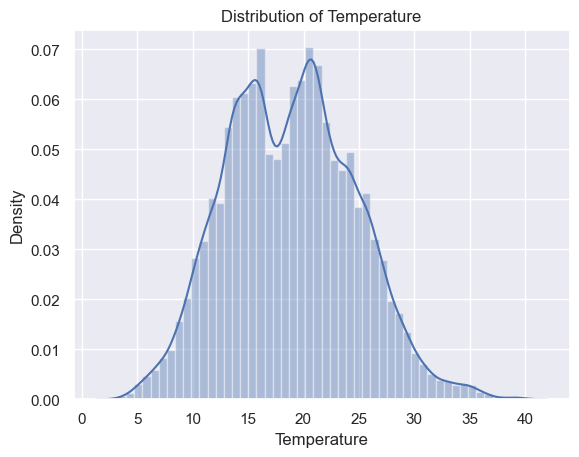

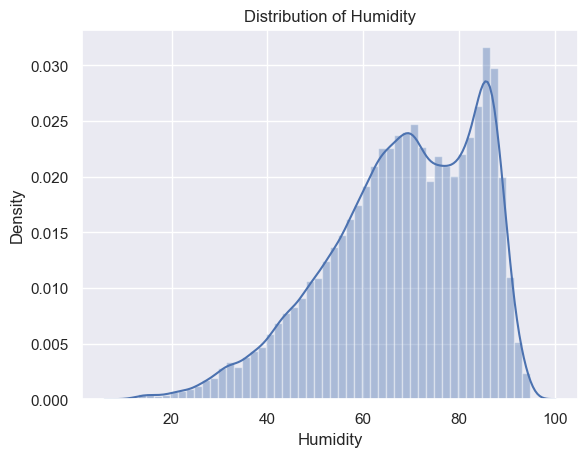

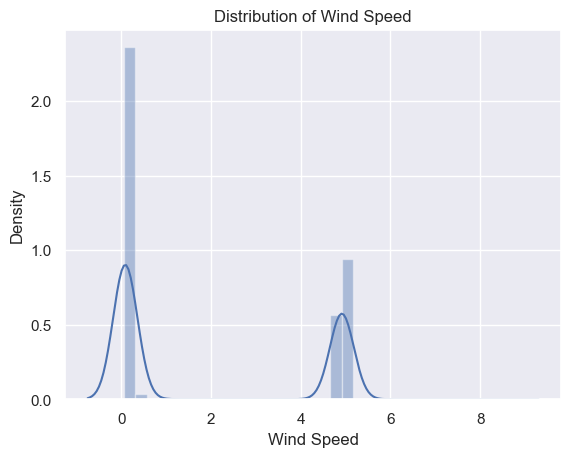

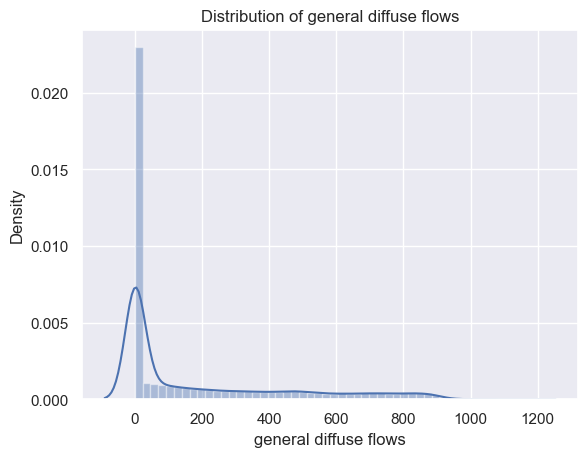

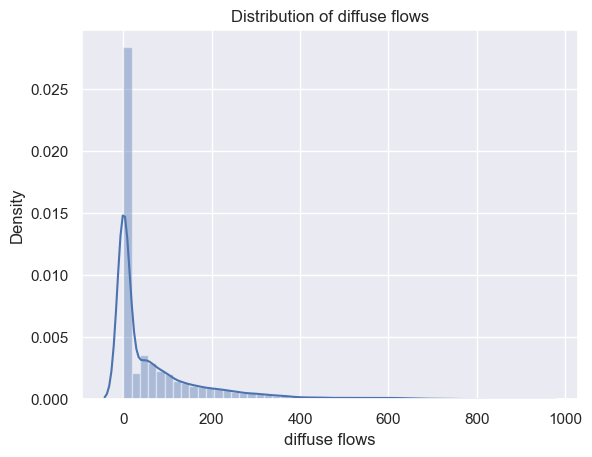

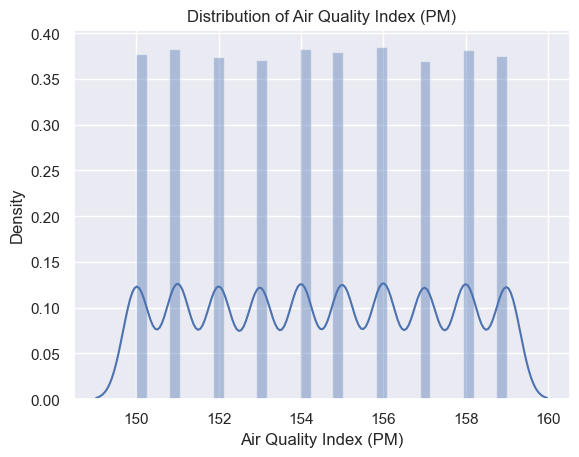

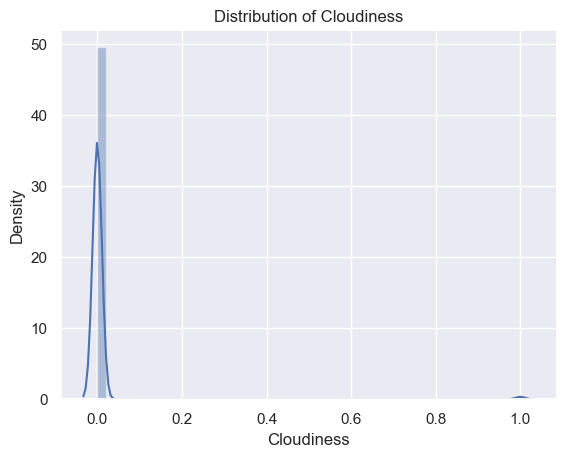

In [23]:
# distribution -
for i in df.columns[:-1]:
    sns.distplot(df[i])
    plt.title(f'Distribution of {i}')
    plt.show()

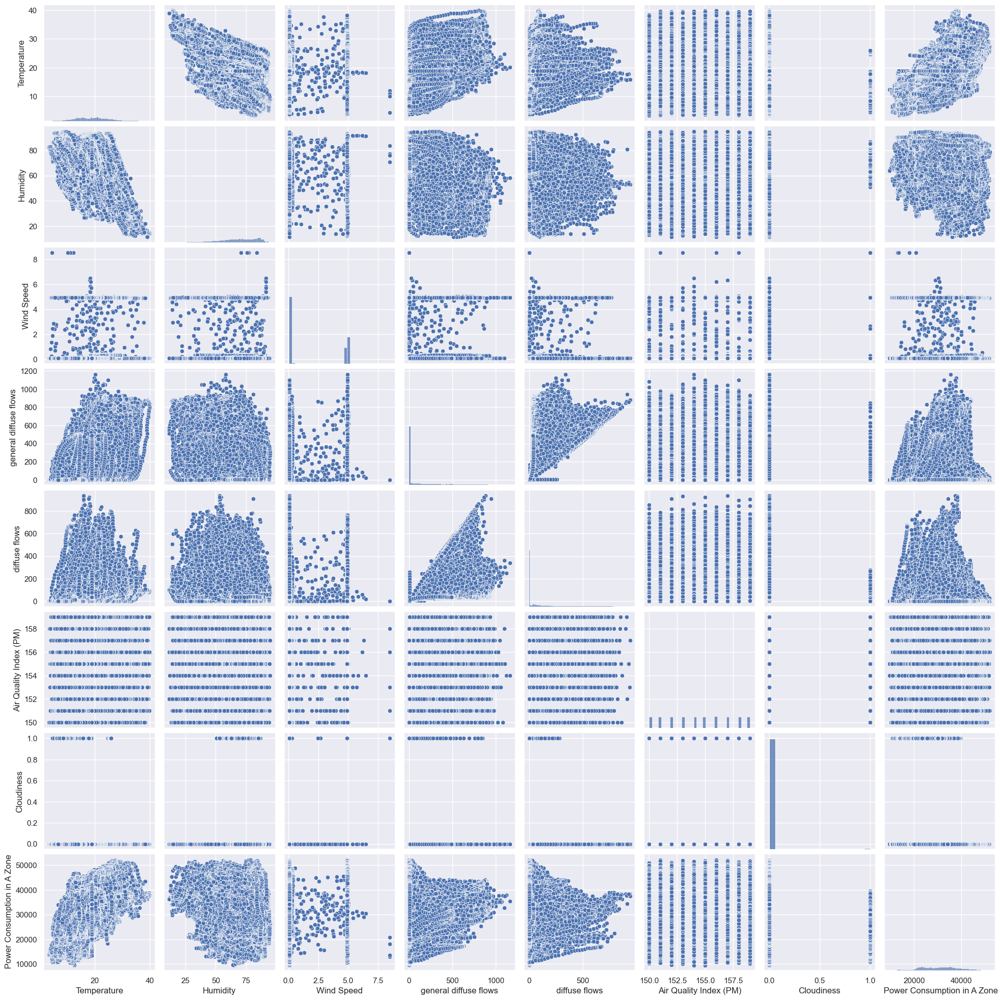

In [25]:
# pairplot-
sns.pairplot(df)
plt.show()

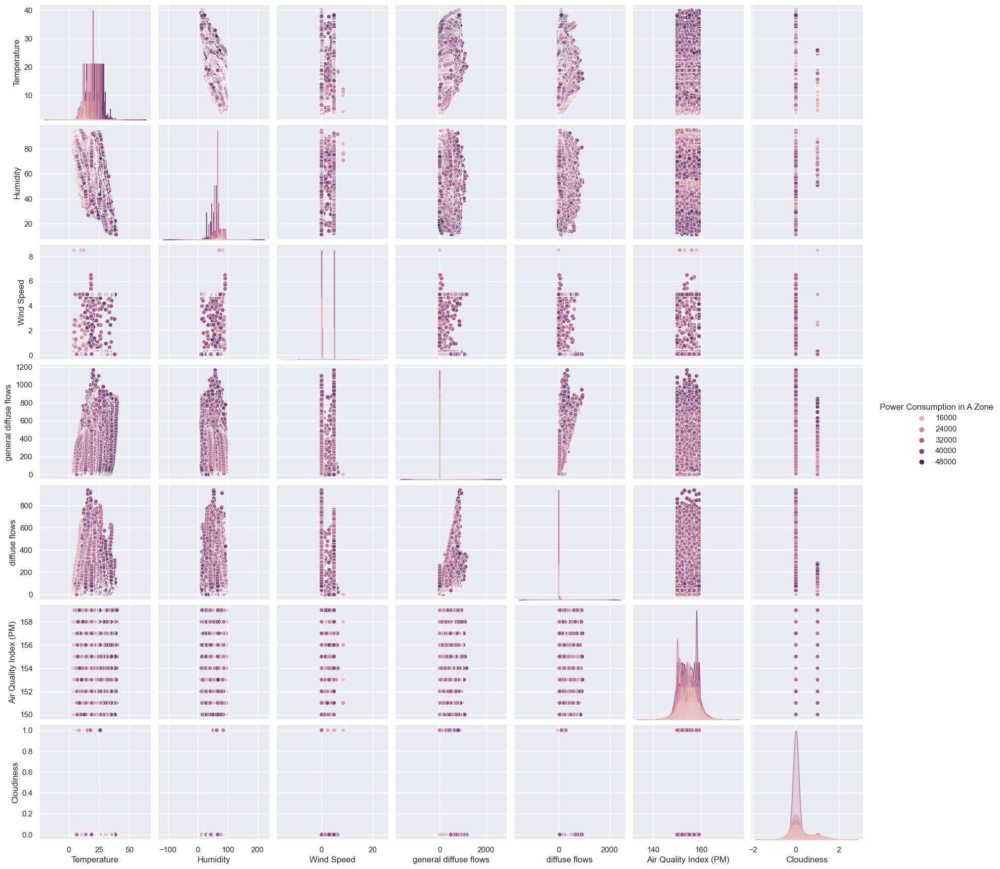

In [24]:
sns.pairplot(data =df,hue =' Power Consumption in A Zone')
plt.show()

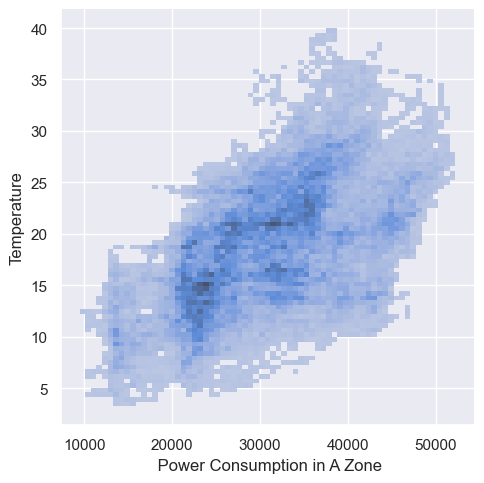

In [22]:
sns.displot(data = df, y = df['Temperature'],x=df[' Power Consumption in A Zone'])
plt.show()

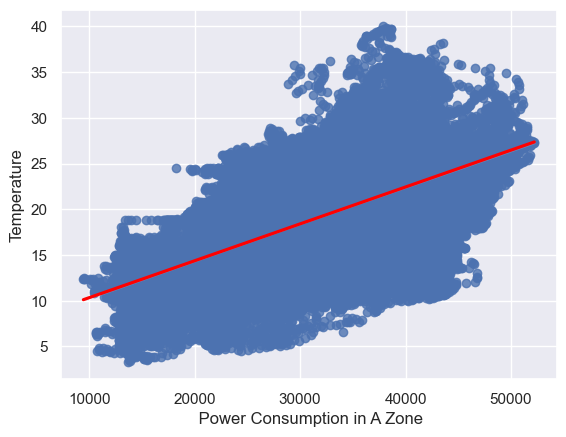

In [47]:
#sns.lmplot(data = df,x =' Power Consumption in A Zone',y='Temperature')
sns.regplot(data = df,x =df[' Power Consumption in A Zone'],y=df['Temperature'],color='b',line_kws={"color": "red"})
plt.show()

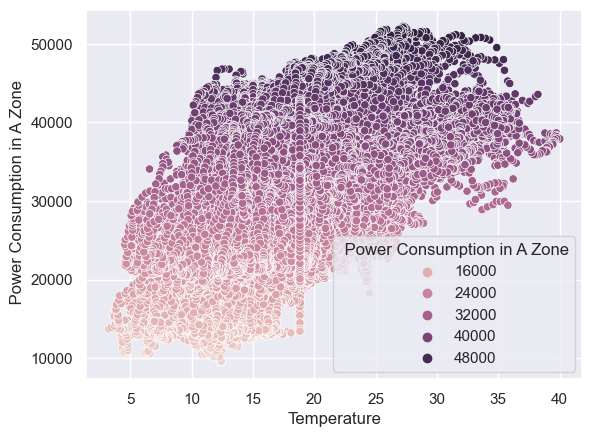

In [44]:
sns.scatterplot(x = df['Temperature'],y = df[' Power Consumption in A Zone'],hue=df[' Power Consumption in A Zone'])
plt.show()

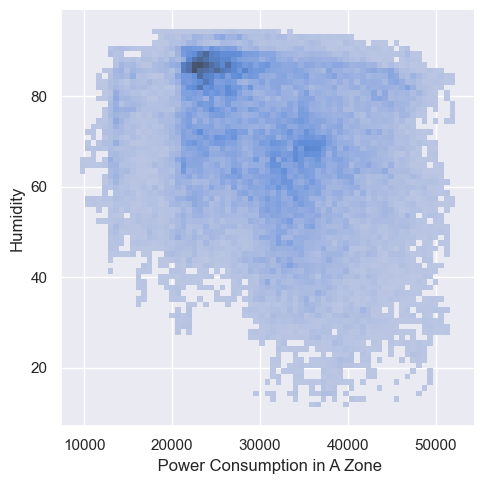

In [30]:
sns.displot(data = df, y = df['Humidity'],x=df[' Power Consumption in A Zone'])
plt.show()

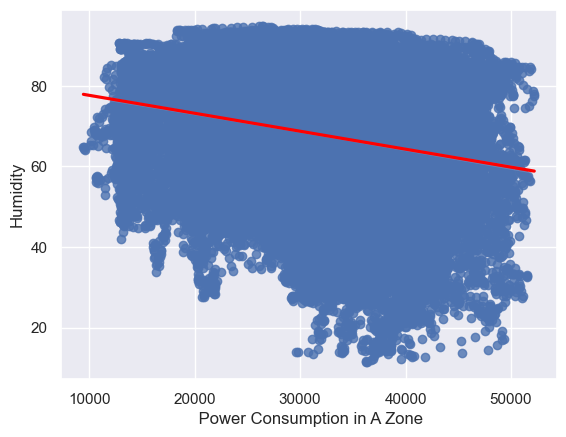

In [46]:
sns.regplot(data = df,x =df[' Power Consumption in A Zone'],y=df['Humidity'],color='b',line_kws={"color": "red"})
plt.show()

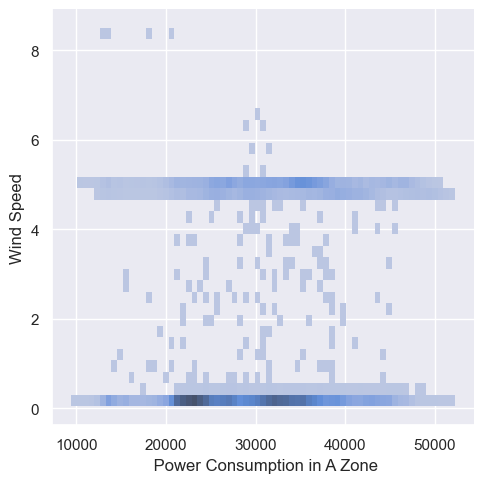

In [32]:
sns.displot(data = df, y = df['Wind Speed'],x=df[' Power Consumption in A Zone'])
plt.show()

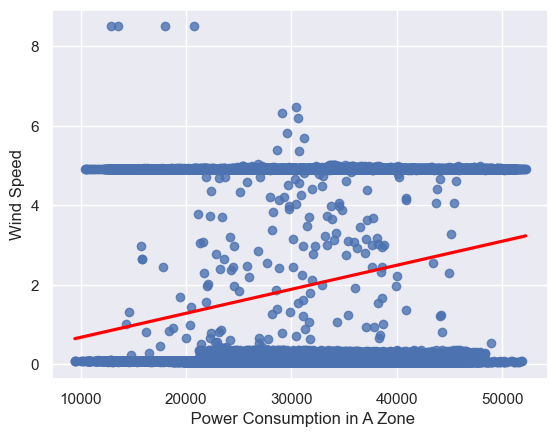

In [45]:
sns.regplot(data = df,x =df[' Power Consumption in A Zone'],y=df['Wind Speed'],color='b',line_kws={"color": "red"})
plt.show()

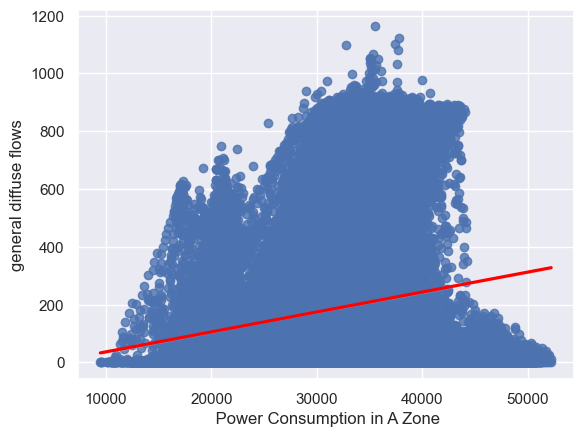

In [44]:
sns.regplot(data = df,x =df[' Power Consumption in A Zone'],y=df['general diffuse flows'],color='b',line_kws={"color": "red"})
plt.show()

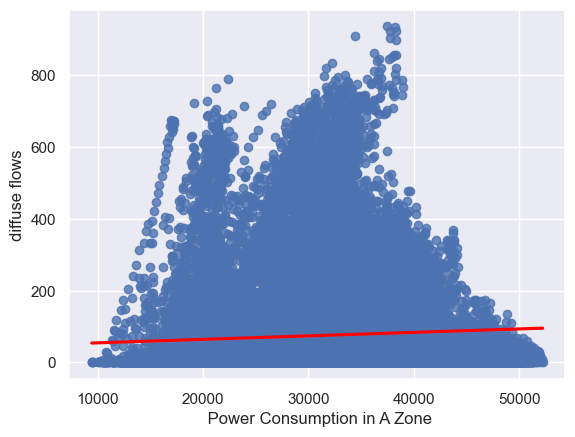

In [43]:
sns.regplot(data = df,x =df[' Power Consumption in A Zone'],y=df['diffuse flows'],color='b',line_kws={"color": "red"})
plt.show()

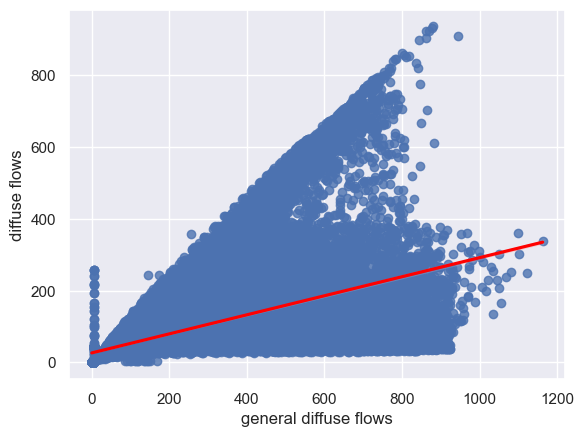

In [42]:
sns.regplot(data = df,x =df['general diffuse flows'],y=df['diffuse flows'],color='b',line_kws={"color": "red"})
plt.show()

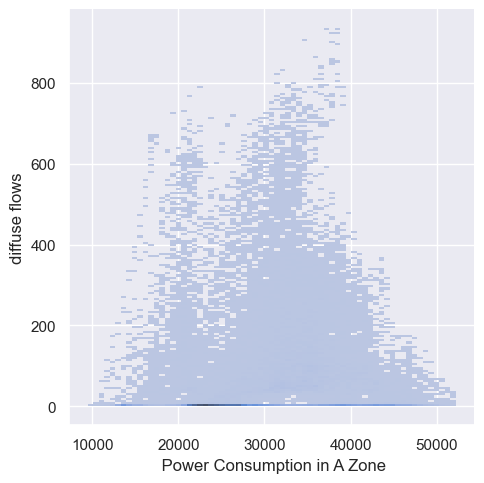

In [38]:
sns.displot(data = df, y = df['diffuse flows'],x=df[' Power Consumption in A Zone'])
plt.show()

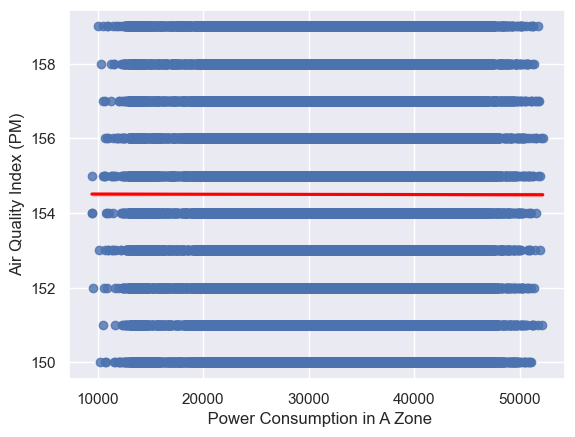

In [48]:
sns.regplot(data = df,x =df[' Power Consumption in A Zone'],y=df['Air Quality Index (PM)'],color='b',line_kws={"color": "red"})
plt.show()

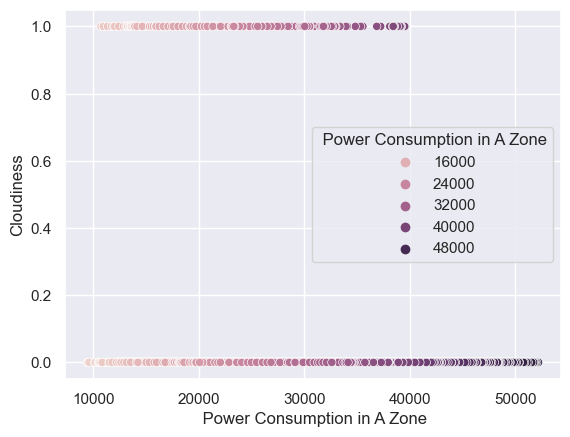

In [22]:
sns.scatterplot(data = df,x =df[' Power Consumption in A Zone'],y=df['Cloudiness'],hue =df[' Power Consumption in A Zone'])
plt.show()

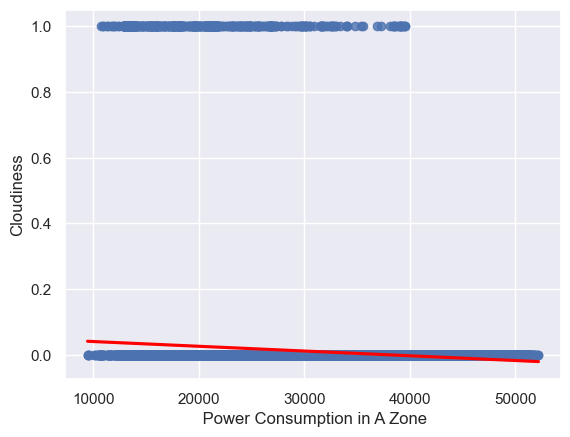

In [19]:
sns.regplot(data = df,x =df[' Power Consumption in A Zone'],y=df['Cloudiness'],color='b',line_kws={"color": "red"})
plt.show()

In [19]:
df.describe()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000
mean,18.827339,68.286530,1.953436,181.923162,74.852230,154.499363,0.009338,31061.821779
std,5.795577,15.541513,2.347970,264.143797,124.072864,2.871077,0.096180,8021.057455
min,3.247000,11.340000,0.050000,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,14.450000,58.340000,0.078000,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,18.820000,69.885000,0.086000,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,22.870000,81.400000,4.915000,317.000000,100.450000,157.000000,0.000000,36721.582445
max,40.010000,94.800000,8.500000,1163.000000,936.000000,159.000000,1.000000,52204.395120


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Temperature                   52583 non-null  float64
 1   Humidity                      52583 non-null  float64
 2   Wind Speed                    52583 non-null  float64
 3   general diffuse flows         52583 non-null  float64
 4   diffuse flows                 52583 non-null  float64
 5   Air Quality Index (PM)        52583 non-null  float64
 6   Cloudiness                    52583 non-null  int64  
 7    Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(7), int64(1)
memory usage: 3.2 MB


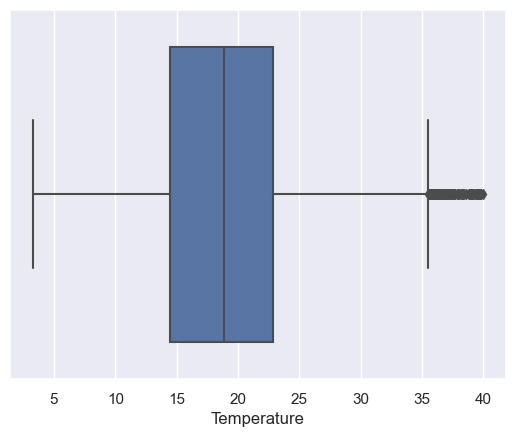

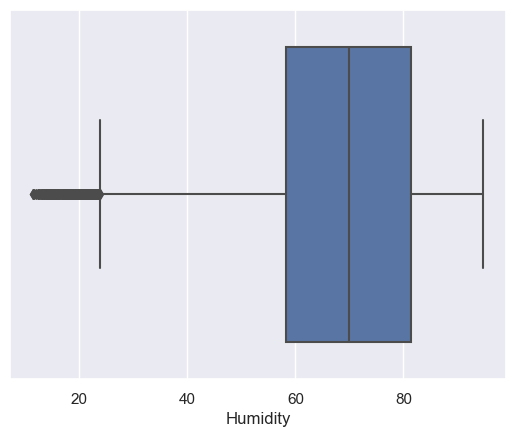

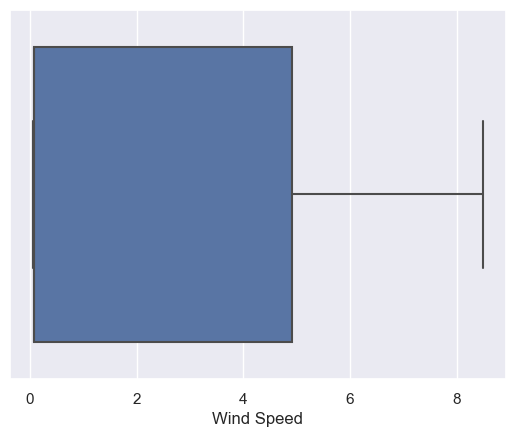

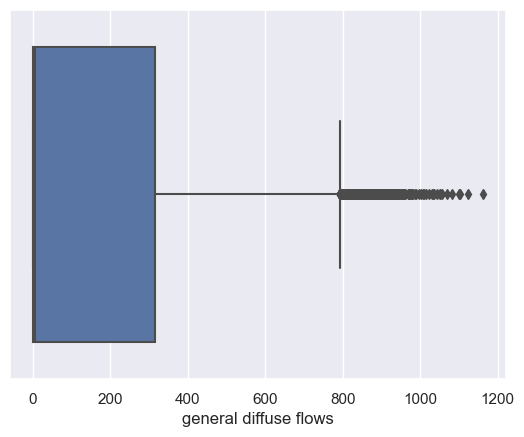

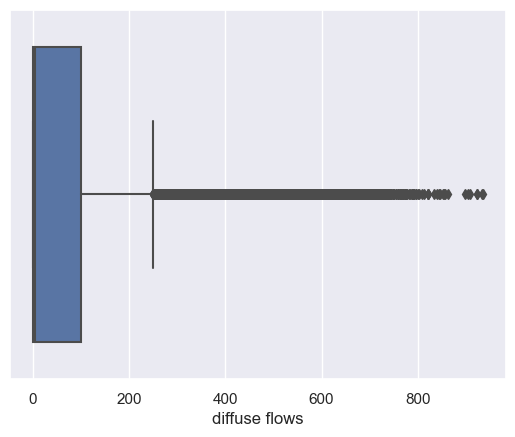

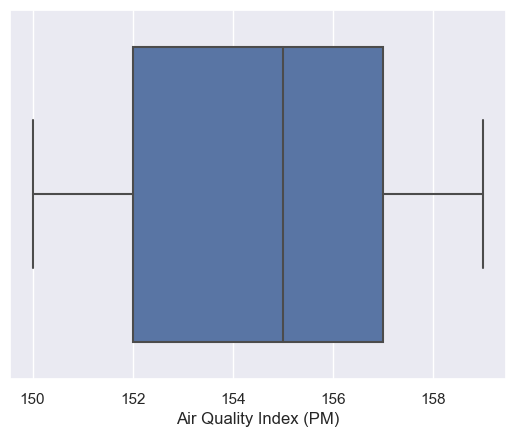

In [23]:
# outlier detection and treatment with IQR-
cols = df.columns[:-2]
for i in cols:
    sns.boxplot(x=df[i])
    plt.show()

In [21]:
# capping outliers-
for i in cols:
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    iqr = q3-q1
    upper_limit = q3 + (1.5 * iqr)
    lower_limit = q1 - (1.5 * iqr)
    df.loc[(df[i]>upper_limit), i] = upper_limit
    df.loc[(df[i]<lower_limit), i] = lower_limit

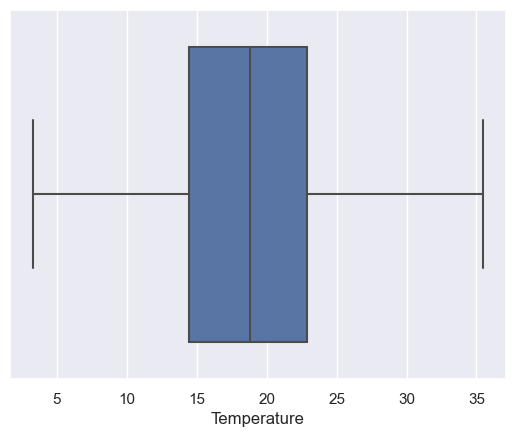

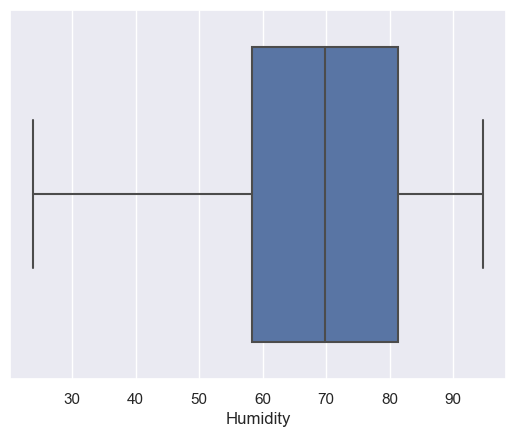

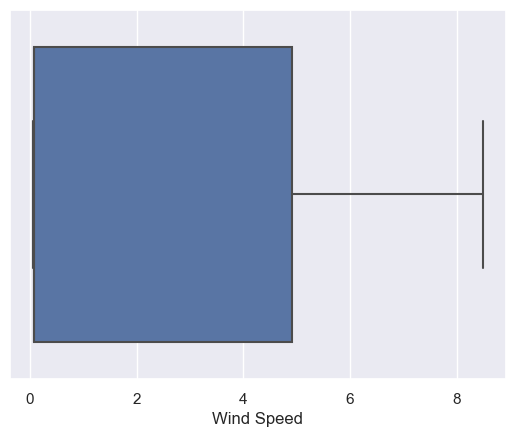

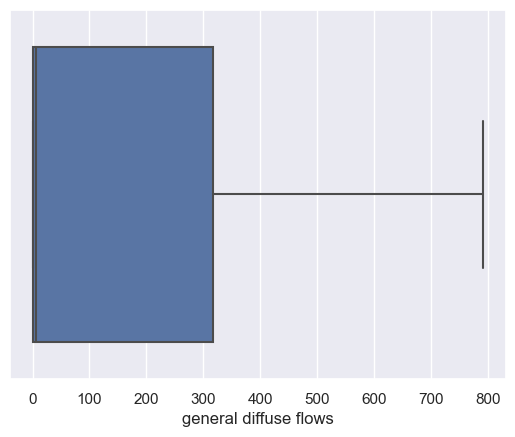

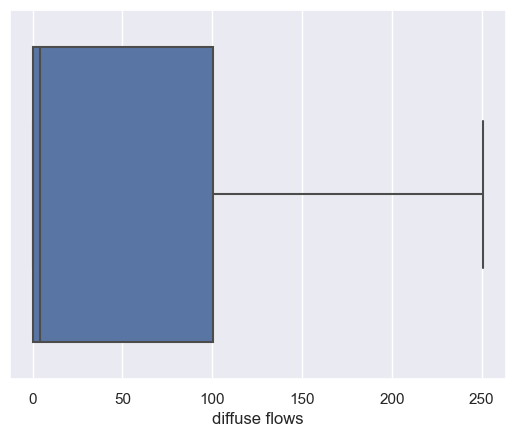

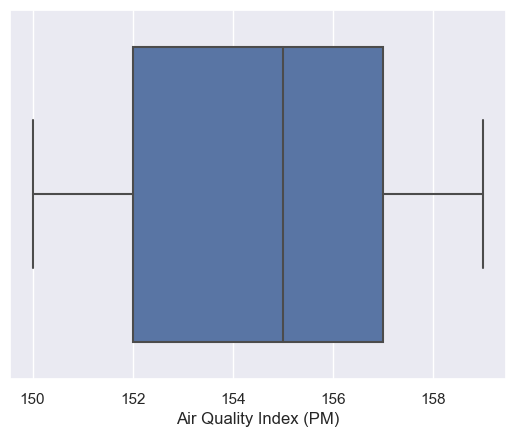

In [25]:
for i in cols:
  sns.boxplot(x = df[i])
  plt.show()

In [22]:
# data analysis tool - 
# from dataprep.eda import create_report
# report = create_report(df)

  0%|                                                                                         | 0/1474 [00:00<…


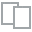
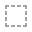
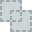
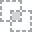
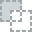
...
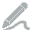
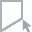
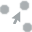
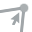
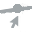

In [23]:
# report.show()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000
mean,18.823179,68.313360,1.953436,179.079258,61.905300,154.499363,0.009338,31061.821779
std,5.782653,15.458215,2.347970,256.982396,84.724407,2.871077,0.096180,8021.057455
min,3.247000,23.750000,0.050000,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,14.450000,58.340000,0.078000,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,18.820000,69.885000,0.086000,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,22.870000,81.400000,4.915000,317.000000,100.450000,157.000000,0.000000,36721.582445
max,35.500000,94.800000,8.500000,792.407000,250.942000,159.000000,1.000000,52204.395120


In [22]:
# checking skewness -
from scipy.stats import skew
skewed = []
for i in df.columns[:-1]:
    print(f'Feature: {i} ,Skewness: {skew(df[i])}')
    if skew(df[i]) >=0.75 or skew(df[i]) <=-0.75:
        a = [i,skew(df[i])]
        skewed.append(a)

Feature: Temperature ,Skewness: 0.17690950278360779
Feature: Humidity ,Skewness: -0.5923795429695442
Feature: Wind Speed ,Skewness: 0.4688827628780162
Feature: general diffuse flows ,Skewness: 1.243783487311554
Feature: diffuse flows ,Skewness: 1.2044509438243554
Feature: Air Quality Index (PM) ,Skewness: -0.001800002351850843
Feature: Cloudiness ,Skewness: 10.203093255770705


In [23]:
skewed

[['general diffuse flows', 1.243783487311554],
 ['diffuse flows', 1.2044509438243554],
 ['Cloudiness', 10.203093255770705]]

In [24]:
lst = []
for i in skewed:
    a = str(i[0])
    lst.append(a)
lst

['general diffuse flows', 'diffuse flows', 'Cloudiness']

In [26]:
#yeojohnson transformation technique is very similar to Box-cox transformation
#but does not require the values to be strictly positive.
from scipy.stats import yeojohnson
for i in lst:
    transformed_data, lambda_value = yeojohnson(df[i])
    df[i] = transformed_data

In [27]:
skew(df['general diffuse flows'])

0.1445785378942355

In [28]:
skew(df['diffuse flows'])

0.12469039575934043

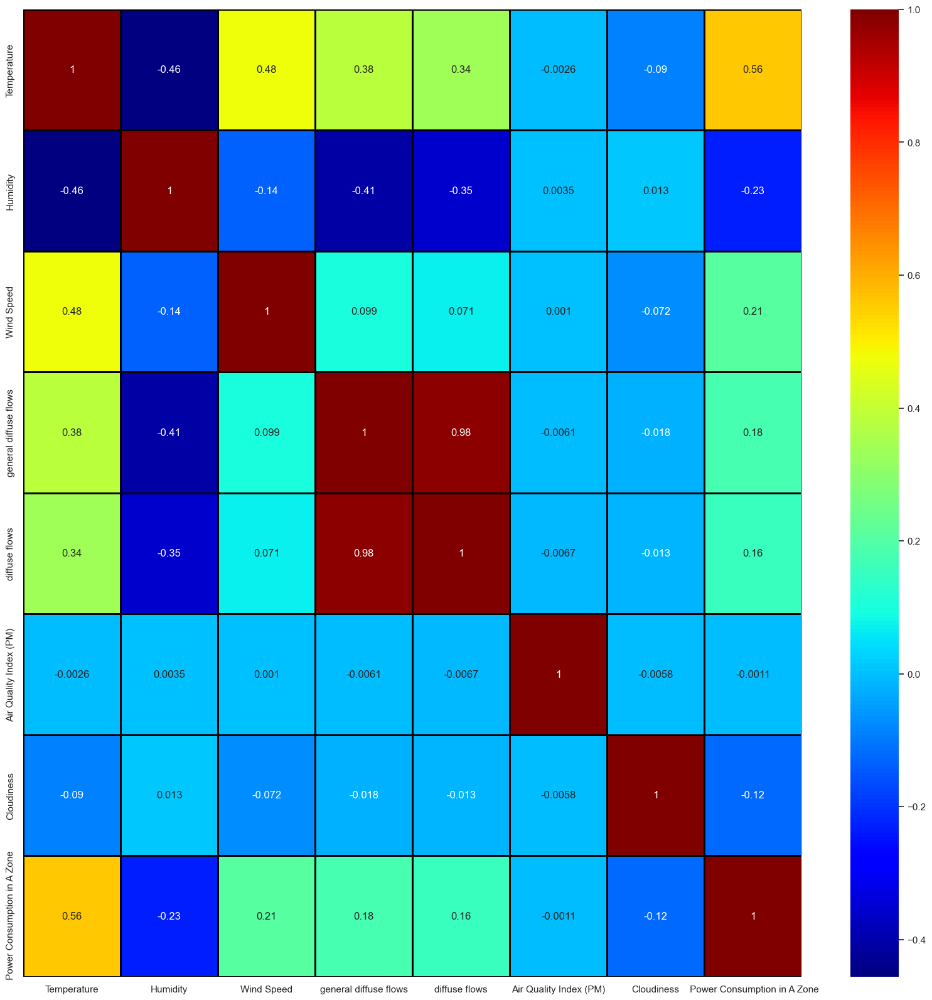

In [34]:
# correlation matrix -
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True,cmap='jet',linecolor='black',linewidth=1)
plt.show()

In [ ]:
#findings - 
# 1) Temperature and humidity are negatively correlated by - 0.46(moderate)
# 2) Temperature and windspeed are positively correlated by - 0.48(moderate)
# 3) General diffuse flows and diffuse flowsare highly correlated by -0.97
# 4) humidity and General diffuse flows are negatively correlated 
#    negatively correlated by - -0.41


In [29]:
corr_matrix = df.corr()
corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) >= 0.75:
            corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))
for pair in corr_pairs:
    print(f"{pair[0]} and {pair[1]} have a correlation of {pair[2]}")

general diffuse flows and diffuse flows have a correlation of 0.9776181660287312


In [30]:
# correlation with target variable - 
tar_corr = df.corrwith(df[' Power Consumption in A Zone'])
tar_corr

Temperature                     0.559367
Humidity                       -0.230026
Wind Speed                      0.206633
general diffuse flows           0.176787
diffuse flows                   0.156829
Air Quality Index (PM)         -0.001137
Cloudiness                     -0.120694
 Power Consumption in A Zone    1.000000
dtype: float64

In [ ]:
# as general diffuse flows and diffuse flows are highly correlated we will drop
# one of the two so dropping diffuse flows as it has lesser correlation to target

In [31]:
import statsmodels.api as sm

X = df['diffuse flows']
X = sm.add_constant(X)  # Add a constant term for intercept
y = df[' Power Consumption in A Zone']

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression results
print(model.summary())

                                 OLS Regression Results                                 
Dep. Variable:      Power Consumption in A Zone   R-squared:                       0.025
Model:                                      OLS   Adj. R-squared:                  0.025
Method:                           Least Squares   F-statistic:                     1326.
Date:                          Sun, 20 Aug 2023   Prob (F-statistic):          1.02e-286
Time:                                  12:52:34   Log-Likelihood:            -5.4667e+05
No. Observations:                         52583   AIC:                         1.093e+06
Df Residuals:                             52581   BIC:                         1.093e+06
Df Model:                                     1                                         
Covariance Type:                      nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
----------------------------

In [32]:
from scipy.stats import pearsonr
data1 = df['diffuse flows']
data2 = df[' Power Consumption in A Zone']
stat, p = pearsonr(data1, data2)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
 print('Probably independent')
else:
 print('Probably dependent')

stat=0.157, p=0.000
Probably dependent


In [33]:
df = df.drop('diffuse flows',axis = 1)
df.head()

,Temperature,Humidity,Wind Speed,general diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
0,6.559,73.8,0.083,0.049638,158.0,0.006472,34055.69620
1,6.414,74.5,0.083,0.067466,159.0,0.006472,29814.68354
2,6.313,74.5,0.080,0.060001,151.0,0.006472,29128.10127
3,6.121,75.0,0.083,0.086775,151.0,0.006472,28228.86076
4,5.921,75.7,0.081,0.046791,154.0,0.006472,27335.69620


In [34]:
df.columns

Index(['Temperature', 'Humidity', 'Wind Speed', 'general diffuse flows',
       'Air Quality Index (PM)', 'Cloudiness', ' Power Consumption in A Zone'],
      dtype='object')

In [35]:
# spliting dataset into dependent and independent variables-
x = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [36]:
x['Cloudiness'].value_counts()

-0.000000    52092
 0.006472      491
Name: Cloudiness, dtype: int64

In [37]:
x.head()

,Temperature,Humidity,Wind Speed,general diffuse flows,Air Quality Index (PM),Cloudiness
0,6.559,73.8,0.083,0.049638,158.0,0.006472
1,6.414,74.5,0.083,0.067466,159.0,0.006472
2,6.313,74.5,0.080,0.060001,151.0,0.006472
3,6.121,75.0,0.083,0.086775,151.0,0.006472
4,5.921,75.7,0.081,0.046791,154.0,0.006472


In [50]:
# #MinMaxScaler
# from sklearn.preprocessing import MinMaxScaler
# for col in x.columns[:-1]:
#     mx = MinMaxScaler()
#     x[col] = mx.fit_transform(x[[col]])

In [39]:
# scaling data -
from sklearn.preprocessing import StandardScaler
for col in x.columns:
    ss = StandardScaler()
    x[col] = ss.fit_transform(x[[col]])

In [40]:
x

,Temperature,Humidity,Wind Speed,general diffuse flows,Air Quality Index (PM),Cloudiness
0,-2.120877,0.354937,-0.796626,-0.997646,1.219288,10.300179
1,-2.145952,0.400221,-0.796626,-0.989444,1.567593,10.300179
2,-2.163418,0.400221,-0.797903,-0.992878,-1.218845,10.300179
3,-2.196621,0.432566,-0.796626,-0.980562,-1.218845,10.300179
4,-2.231208,0.477850,-0.797477,-0.998955,-0.173930,10.300179
...,...,...,...,...,...,...
52578,-0.000550,0.471381,-0.791941,1.167337,0.870984,-0.097086
52579,-0.000550,0.335530,-0.794070,1.176855,0.870984,-0.097086
52580,-0.000550,0.115580,-0.795774,1.185677,0.870984,-0.097086
52581,-0.000550,-0.036444,-0.795348,1.191811,-0.870540,-0.097086


In [ ]:
# Variance Inflation Factor (VIF) - to check multicollinearity relation between 
# Independent vs dependent variable
# multicollinearity test - VIF = 1 /(1- Rj2)

In [41]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(x):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = x.columns
    vif["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]

    return(vif)

In [42]:
# here no multicollinearity found - VIF < 5
calc_vif(x)

,variables,VIF
0,Temperature,1.734459
1,Humidity,1.380034
2,Wind Speed,1.315819
3,general diffuse flows,1.279791
4,Air Quality Index (PM),1.000077
5,Cloudiness,1.010072


In [64]:
# Splitting the data into traing for model building-
from sklearn.model_selection import train_test_split,KFold, cross_val_score
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=121)

In [65]:
x_train

,Temperature,Humidity,Wind Speed,general diffuse flows,Air Quality Index (PM),Cloudiness
25245,0.367797,0.665454,1.261767,1.031363,-0.522235,-0.097086
48476,-0.834085,0.439035,-0.797477,0.734463,0.522679,-0.097086
9968,-1.257770,0.361406,1.263897,-1.000708,0.174374,-0.097086
33464,0.888324,0.581356,1.264323,1.160313,0.174374,-0.097086
16238,0.284789,-0.784274,-0.794070,0.668472,0.522679,-0.097086
...,...,...,...,...,...,...
24915,0.189676,0.147925,1.262193,-0.991158,0.522679,-0.097086
51265,-1.107319,0.477850,-0.800459,-1.003792,0.870984,-0.097086
28148,1.618100,-0.212404,1.262193,1.324242,-0.522235,-0.097086
37333,-0.740701,0.380813,1.260916,-0.991158,-1.567149,-0.097086


In [45]:
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(36808, 6) (15775, 6) (36808,) (15775,)


In [ ]:
# model building - 
# RandomForestRegressor

In [66]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()
model.fit(x_train, y_train)

RandomForestRegressor()

In [67]:
pred_y = model.predict(x_test)

In [68]:
y_pred_train =model.predict(x_train)
y_pred_test =model.predict(x_test)

In [69]:
# bias vs variance - 
print("Train Accuracy", r2_score(y_train, y_pred_train))
print("*****************************************************")
print("Test Accuracy", r2_score(y_test, y_pred_test))

Train Accuracy 0.9443740607636636
*****************************************************
Test Accuracy 0.6090342247005704


In [50]:
mean_absolute_error(y_test, y_pred_test)

3493.4478650037613

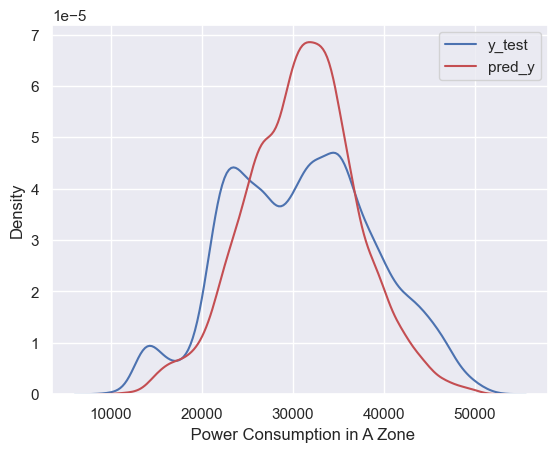

In [70]:
# actual vs predicted graph -
sns.distplot(y_test,label='y_test',hist=False)
sns.distplot(pred_y,label='pred_y',hist=False,color='r')
plt.legend()
plt.show()

In [ ]:
#RMSE
print(np.sqrt(mean_squared_error(y_test, y_pred_test)))

In [ ]:
## Adjusted R^2 -
r2_score = r2_score(y_test, y_pred_test)
n = df.shape[0] # total number of observations
p = df.shape[1] - 1 # number of predictors
adj_r2_score = 1 - (1-r2_score)*(n-1)/(n-p-1)
adj_r2_score

In [75]:
df.shape

(52583, 7)

In [51]:
from sklearn.linear_model import LinearRegression
linear_model = LinearRegression()

kfold = KFold(10)
result = cross_val_score(linear_model,x_train, y_train,cv=kfold) # scoring='neg_mean_absolute_error','neg_mean_squared_error','r2',‘neg_root_mean_squared_error’
print(result)
print(f'Accuracy:  {np.mean(result):.3f}')

[0.31877059 0.32151936 0.33561131 0.30292635 0.32912797 0.32177073
 0.34192832 0.30888986 0.31973018 0.33595286]
Accuracy:  0.324


In [52]:
linear_model.fit(x_train, y_train)

LinearRegression()

In [53]:
pred_y = linear_model.predict(x_test)

In [54]:
linear_model.intercept_

31055.833650185756

In [55]:
linear_model.coef_

array([5014.08299809,  206.37452739, -687.72462334, -371.1585584 ,
        -25.11894354, -565.97893879])

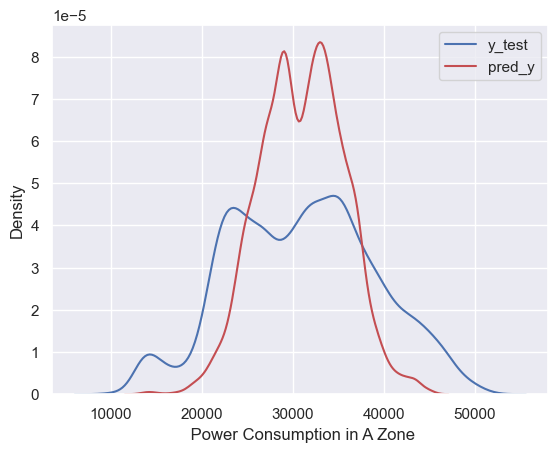

In [56]:
# actual vs predicted graph -
sns.distplot(y_test,label='y_test',hist=False)
sns.distplot(pred_y,label='pred_y',hist=False,color='r')
plt.legend()
plt.show()

In [57]:
y_pred_train =linear_model.predict(x_train)
y_pred_test = linear_model.predict(x_test)

In [58]:
# bias no variance - 
print("Train Accuracy", r2_score(y_train, y_pred_train))
print("*****************************************************")
print("Test Accuracy", r2_score(y_test, y_pred_test))

Train Accuracy 0.32427085561990854
*****************************************************
Test Accuracy 0.3280953747926689


In [59]:
print("Train MAE", mean_absolute_error(y_train, y_pred_train))
print("*****************************************************")
print("Test MAE", mean_absolute_error(y_test, y_pred_test))

Train MAE 5344.1965508779085
*****************************************************
Test MAE 5264.837225517554


In [60]:
print(r2_score(y_test, pred_y))

0.3280953747926689


In [61]:
from sklearn.linear_model import SGDRegressor

In [62]:
sgd= SGDRegressor()
sgd.fit(x_train, y_train)

SGDRegressor()

In [63]:
y_pred_sgd = sgd.predict(x_test)
r2_score(y_test, y_pred_sgd)

0.3276810199663126

In [9]:
x = 'string'
r = ''
for i in range(len(x)-1, -1, -1):
    r +=x[i]
print(r)

gnirt


In [22]:
x = [1,2,3,4,5]
z = ''.join(map(str,x))
z


'12345'

In [24]:
z = [1,2,3,4,5]
r = []
for i in range(len(z)-1, -1, -1):
    r.append(z[i])
print(r)

[5, 4, 3, 2, 1]


In [25]:
z = '12345'
x = z.split(',')
x

['12345']

In [27]:
z = '12345'
x = list((z))
x

['1', '2', '3', '4', '5']